# **Israel Elections Data Analysis**

An example notebook showing how to read and display the Israel 2021 elections results. This is the notebook for the first week.

In [25]:
# Add a check if we run in google colab or locally in jupyter notebook
run_in_colab = False
if 'google.colab' in str(get_ipython()):
    run_in_colab = True
    print('Running on CoLab')
else:
    print('Running locally on Jupyter')



Running on CoLab


In [26]:
# First install tha needed packages using conda in the current Jupyter kernel
# Run once - should take a long time!
import sys
#if not(run_in_colab):
#  !conda install --yes --prefix {sys.prefix} numpy
#  !conda install --yes --prefix {sys.prefix} pandas
#  !conda install --yes --prefix {sys.prefix} matplotlib
#  !conda install --yes --prefix {sys.prefix} statsmodels  # statistical modelling 
#  !conda install --yes --prefix {sys.prefix} xlrd  # read excel 



# Alternatively, if your python wasn't installed using anaconda, we can use pip install: 
# !{sys.executable} -m pip install numpy
# !{sys.executable} -m pip install pandas
# !{sys.executable} -m pip install matplotlib


In [27]:
# Import modules 
import numpy as np  # a module for working with numerical array 
import pandas as pd  # a module for working with data-frames
import statsmodels.api as sm  # a module for statistical modelling (e.g. regression analysis)

First, we need to mount our local drive to the colab network

In [28]:
# Mount drive in google colab
if run_in_colab:
    from google.colab import drive
    drive.mount('/content/drive')
else:  # Set local path 
    data_path = "C:/Users/Or Zuk/Google Drive/HUJI/Teaching/Lab_52568/Data/Elections/"  


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [58]:
# Loading elections 2021 elections data:
if run_in_colab:
    from google.colab import files
    uploaded = files.upload()

Saving eshkol_hevrati_calcali.csv to eshkol_hevrati_calcali (1).csv
Saving votes per ballot 2021.csv to votes per ballot 2021 (2).csv
Saving votes per city 2021.csv to votes per city 2021 (2).csv


In [30]:
# import io

# data_type = "city" # "ballot"  # city
# if   run_in_colab:
#     df_2021_raw = pd.read_csv(io.BytesIO(uploaded['votes per city 2021.csv']),  encoding = 'iso-8859-8', index_col='שם ישוב')
# else:  # read local file
#     if data_type == "ballot":
#         df_2021_raw = pd.read_csv(data_path + 'votes per ballot 2021.csv',  encoding = 'iso-8859-8', index_col='שם ישוב')
#         # preprocessing of ballot
#         df_2021 = df_2021_raw.drop('סמל ועדה', axis=1) # new column added in Sep 2019
#         df_2021 = df_2021[df_2021.columns[8:-1]] # removing "metadata" columns
#     else:
#         df_2021_raw = pd.read_csv(data_path + 'votes per city 2021.csv',  encoding = 'iso-8859-8', index_col='שם ישוב')
#         # preprocessing of cities 
#         df_2021 = df_2021_raw.drop('סמל ועדה', axis=1) # new column added in Sep 2019
#         df_2021 = df_2021[df_2021.columns[5:-1]] # removing "metadata" columns
# # Dataset is now stored in a Pandas Dataframe
import io
data_type = "city" # "ballot"  # city
if   run_in_colab:
    df_2021_raw = pd.read_csv(io.BytesIO(uploaded['votes per city 2021.csv']),  encoding = 'iso-8859-8', index_col='שם ישוב')
    df_2021 = df_2021_raw.drop('סמל ועדה', axis=1) # new column added in Sep 2019
    df_2021 = df_2021[df_2021.columns[5:-1]] # removing "metadata" columns
    df_2021_ballots_raw = pd.read_csv(io.BytesIO(uploaded['votes per ballot 2021.csv']),  encoding = 'iso-8859-8', index_col='סמל ישוב')
    df_2021_ballots = df_2021_ballots_raw.drop('סמל ועדה', axis=1) # new column added in Sep 2019
    df_2021_ballots = df_2021_ballots[df_2021_ballots.columns[8:-1]] # removing "metadata" columns
    df_2021_ballots = df_2021_ballots.drop(["כשרים"], axis=1)
    df_2021_ballots = df_2021_ballots.drop([9999], axis=0)
    df_2021_ballots_raw = df_2021_ballots_raw.drop([9999], axis=0)
    df_2021_raw = df_2021_raw.drop(['מעטפות חיצוניות'], axis=0)
    df_2021 = df_2021.drop(['מעטפות חיצוניות'], axis=0)
else:  # read local file
    if data_type == "ballot":
        df_2021_raw = pd.read_csv(data_path + 'votes per ballot 2021.csv',  encoding = 'iso-8859-8', index_col='שם ישוב')
        # preprocessing of ballot
        df_2021 = df_2021_raw.drop('סמל ועדה', axis=1) # new column added in Sep 2019
        df_2021 = df_2021[df_2021.columns[8:-1]] # removing "metadata" columns
    else:
        df_2021_raw = pd.read_csv(data_path + 'votes per city 2021.csv',  encoding = 'iso-8859-8', index_col='שם ישוב')
        # preprocessing of cities 
        df_2021 = df_2021_raw.drop('סמל ועדה', axis=1) # new column added in Sep 2019
        df_2021 = df_2021[df_2021.columns[5:-1]] # removing "metadata" columns

In [31]:
df_2021 = df_2021_raw.drop('סמל ועדה', axis=1) # new column added in Sep 2019
df_2021 = df_2021[df_2021.columns[5:-1]] # removing "metadata" columns

In [32]:
# df_2021.reset_index(inplace=True)
df_2021.style.set_properties(**{'text-align': 'left'})

In [33]:
from matplotlib import pyplot as plt


In [34]:
# Compute votes share only for parties above a certain threshold 
def parties_votes_percents(df, thresh):
    par = df.sum().div(df.sum().sum()).sort_values(ascending=False)
    return par[par > thresh]

total_votes = parties_votes_percents(df_2021, 0.001)  # total votes for each party

Create a dictionary mapping parties names to voting letters

In [35]:
parties_dict_2021 ={'אמת' : "עבודה", 'מרצ' : "מרצ",  'ג' : "יהדות התורה", 'עם'  : "רעם",  'ת'  : "תקוה חדשה", 'ודעם'  : "הרשימה המשותפת", 'ב'  : "ימינה", 'ט'  : "הציונות הדתית",
 'ל'  : "ישראל ביתנו", 'מחל'  : "הליכוד",  'פה'  : "יש עתיד", 'כן'  : "כחול לבן", 'שס'  : "שס"}


Read the election results by ballot (not city)

In [36]:
if   run_in_colab:
    df_2021_ballots_raw = pd.read_csv(io.BytesIO(uploaded['votes per ballot 2021.csv']),  encoding = 'iso-8859-8', index_col='שם ישוב')
else:
  df_2021_ballots_raw = pd.read_csv(data_path + 'votes per ballot 2021.csv',  encoding = 'iso-8859-8', index_col='שם ישוב')  # need to read locally

In [37]:
df_2021_ballots = df_2021_ballots_raw.drop('סמל ועדה', axis=1) # new column added in Sep 2019
df_2021_ballots = df_2021_ballots[df_2021_ballots.columns[8:-1]] # removing "metadata" columns
df_2021_ballots_raw = df_2021_ballots_raw.drop(index = "מעטפות חיצוניות")
df_2021_ballots= df_2021_ballots.drop(index = "מעטפות חיצוניות")
df_2021_ballots = df_2021_ballots[parties_dict_2021.keys()]

In [38]:
# Make corrections to the votes 
# Correct for voting turnout in cities/ballots (from lab2)
# df - matrix of voters for each party and each city
# v - vector of total bz"b for each city 
# Assume that for each city, the proportion for each party is the same fofr voters and non-voters
def simple_turnout_correction(df, v):
    p = df.sum().div(df.sum().sum())  # votes without correction
    exp_df = pd.DataFrame().reindex_like(df)
    if v.size == df.shape[0]:
        v_mat = pd.concat([alpha] * (df.shape[1]), axis=1)
        exp_df = np.random.binomial(df,v_mat)
    elif v.size == df.shape[1]:
        v_mat = pd.DataFrame([v]*(df.shape[0]))
        exp_df = np.random.binomial(df,v_mat)
    else:
        v_mat = v
        exp_df = np.random.binomial(df,v_mat)
    # q_hat = ...
    return pd.DataFrame(exp_df,columns=df.columns,index = df.index)

In [39]:
bazab = df_2021_ballots_raw["בזב"]
kosher = df_2021_ballots_raw["כשרים"]
normalized_vec = bazab/kosher
alpha = kosher / bazab

n_tilda_df = df_2021_ballots.mul(normalized_vec,axis = 0).round()
n_tilda_df_2 = n_tilda_df[parties_dict_2021.keys()]
n_ij = n_tilda_df_2.sum().div(n_tilda_df_2.sum().sum())

In [40]:
def simulation(num_simu,df,v):
    df_estimators = pd.DataFrame(columns = df.columns)
    df_qj_hat  = pd.DataFrame(columns = df.columns)
    for i in range(num_simu):
        simu_df = simple_turnout_correction(df,v)
        norm_df = simu_df.mul(normalized_vec,axis = 0)
        p_j = simu_df.sum().div(simu_df.sum().sum())
        q_j_hat = norm_df.sum().div(norm_df.sum().sum())
        df_pj_estimators = df_estimators.append(p_j,ignore_index=True)
        df_qj_hat = df_qj_hat.append(q_j_hat,ignore_index=True)
    return df_pj_estimators,df_qj_hat

In [41]:
votes = parties_votes_percents(df_2021_ballots, 0.0325)
names = votes.keys()
all_names = df_2021_ballots.columns
df_2021 = df_2021[names]

# Solution 5

# 1

# a

In [42]:
def ols_lab5(df, turnout):

  positive = np.where(np.array(turnout) > 0)
  df = df.iloc[positive]
  turnout = turnout.iloc[positive]
  bazab = df.sum(axis=1) / turnout
  df['שם ישוב'] = df.index
  diag = pd.get_dummies(df['שם ישוב']) * df.sum(axis=1).to_numpy()[:, None]
  x = pd.concat([df, diag], axis=1).drop('שם ישוב', axis=1)
  model = sm.OLS(bazab, x).fit()
  alpha = model.params[13:]
  beta = model.params[:13]
  df = df.drop('שם ישוב', axis=1)
  alp_multply = df.apply(lambda row: row*alpha[row.name], axis=1)
  bet_multply = df * beta
  combine = alp_multply + bet_multply
  q_hat5 = combine.sum(axis=0)/combine.sum().sum()
  return q_hat5


# **2**

In [43]:

def regression_correction(df, turnout):
    positive = np.where(np.array(turnout) > 0)
    df = df.iloc[positive]
    turnout = turnout.iloc[positive]

    param = df.sum().div(df.sum().sum())  
    bzb = df.sum(axis=1) / turnout 
    model = sm.OLS(bzb, df).fit() 
    q_hat = param * model.params  
    q_hat = q_hat / q_hat.sum()  
    return param, q_hat, model.params # beta_inv

In [44]:
def sim_data(N,V):
  new_df = pd.DataFrame(np.random.binomial(N,V))
  new_df.index = df_2021.index
  v = new_df.sum(axis=1)/ N.sum(axis=1)
  return new_df, v

In [45]:
# Nij~ :
N_tilde = np.array(df_2021.mul(df_2021_raw['בזב'].sum()).div(df_2021_raw['כשרים'].sum()),dtype='int32')

# 3 types of Vi 
v = df_2021_raw['כשרים'].div(df_2021_raw['בזב'])
u = list(np.random.permutation(0.2 + np.array(range(13)) * 0.05))
#u = [0.6,0.65,0.75,0.5,0.4,0.35,0.8,0.55,0.45,0.25,0.3,0.7,0.2]
#u_random = random.sample(u, len(u))

dim = df_2021.shape
# converting them to the desired shape:
V_v = np.tile(np.array([v]).transpose(), (1, len(names)))
V_u = np.tile(np.array(u), (dim[0],1))
#V_u_random = np.tile(np.array(u_random), (dim[0],1))

V_u_random = V_u.copy()
for i in range(df_2021.shape[0]):
  V_u_random[i,] = np.random.permutation(u)
#V_u_random = np.tile(np.array(u_random), (dim[0],1))

In [46]:
def turnout_correction(df, fix_param):
  p = parties_votes_percents(df, 0) 
  q_hat = parties_votes_percents(df.div(fix_param, axis = "rows"), 0)
  return q_hat


In [47]:
def simulations(iters,N,V):
  p_mat = np.zeros([iters, len(names)])
  q_hat = np.zeros([iters, len(names)]) 
  q_hat_reg = np.zeros([iters, len(names)]) 
  q_hat_5 = np.zeros([iters, len(names)]) 

  # in every simulation we calculate p and q_hat (after fixing the data)
  for i in range(0,iters):
    new_df, v = sim_data(N,V)
    q_hat[i,] = turnout_correction(new_df, v)
    p_mat[i,], q_hat_reg[i,] = regression_correction(new_df, v)[0:2]
    q_hat_5[i,] = ols_lab5(new_df, v)

  return p_mat, q_hat, q_hat_reg, q_hat_5

In [ ]:
iters = 50 # number of simulations
q_real = N_tilde.sum(axis=0)/(N_tilde.sum())

sim_v = simulations(iters, N_tilde, V_v)
mean_p_v = np.nanmean(sim_v[0],axis=0)
mean_q_v = np.nanmean(sim_v[1],axis=0)
mean_q_v_beta = np.nanmean(sim_v[2],axis=0)
std_q_v = np.std(sim_v[1],axis=0) # Compute also standard deviations 
std_q_v_beta = np.std(sim_v[2],axis=0)
mean_q_v_5 = np.nanmean(sim_v[3],axis=0)
std_q_v_5 = np.std(sim_v[3],axis=0)

sim_u = simulations(iters, N_tilde, V_u)
mean_p_u = sim_u[0].mean(axis=0) 
mean_q_u = sim_u[1].mean(axis=0) 
mean_q_u_beta = sim_u[2].mean(axis=0)
std_q_u = sim_u[1].std(axis=0) 
std_q_u_beta = sim_u[2].std(axis=0)
mean_q_u_5 = np.nanmean(sim_u[3],axis=0)
std_q_u_5 = np.std(sim_u[3],axis=0)

sim_u_random = simulations(iters, N_tilde, V_u_random)
mean_p_u_random = sim_u_random[0].mean(axis=0)
mean_q_u_random = sim_u_random[1].mean(axis=0)
mean_q_u_random_beta = sim_u_random[2].mean(axis=0)
std_q_u_random = sim_u_random[1].std(axis=0)
std_q_u_random_beta = sim_u_random[2].std(axis=0)
mean_q_u_random_5 = np.nanmean(sim_u_random[3],axis=0)
std_q_u_random_5 = np.std(sim_u_random[3],axis=0)

In [49]:
names_parties = {i: parties_dict_2021[i] for i in names}
names_parties = names_parties.values()

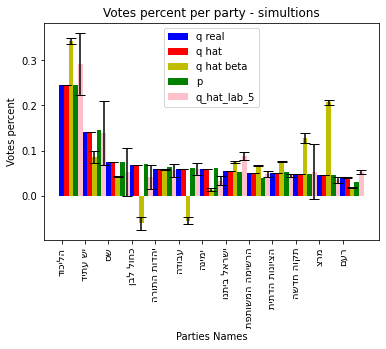

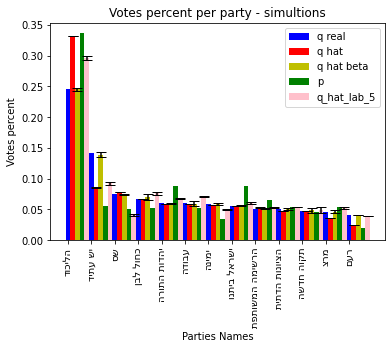

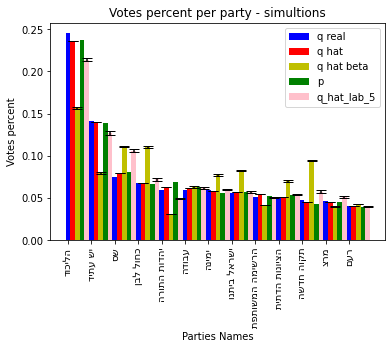

(<Figure size 432x288 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7f39d2423f90>)

In [50]:
# Bar plot for a party, only showing values above a certain threshold after fixing:
def party_bar_fix(q_real, q_hat, q_hat_beta, q_hat_std, q_hat_beta_std, p, q_hat_5, q_hat_5_std ):
    width = 0.2  # set column width 
    n = len(votes)
    rev_names = [names_parties[::-1] for names_parties in list(names_parties)]
    fig, ax = plt.subplots()  # plt.subplots()

    q_real_bar = ax.bar(np.arange(n), list(q_real), width, color='b')
    q_hat_bar = ax.bar(np.arange(n)+width, q_hat, width, color='r', yerr = q_hat_std, capsize=5)
    q_hat_beta_bar = ax.bar(np.arange(n)+2*width, q_hat_beta, width, color='y', yerr = q_hat_beta_std, capsize=5)
    p_bar = ax.bar(np.arange(n)+3*width, p, width, color='g')
    q_hat_5 = ax.bar(np.arange(n)+4*width, q_hat_5, width, color='pink', yerr = q_hat_5_std, capsize=5)

    ax.set_ylabel('Votes percent')
    ax.set_xlabel('Parties Names')
    ax.set_title('Votes percent per party - simultions')
    ax.set_xticks(np.arange(n))
    ax.set_xticklabels(rev_names, rotation=90)
    ax.legend((q_real_bar, q_hat_bar, q_hat_beta_bar, p_bar, q_hat_5), ('q real', 'q hat', 'q hat beta', 'p', 'q_hat_lab_5'))
    plt.show()

    return fig, ax

party_bar_fix(q_real, mean_q_v, mean_q_v_beta, std_q_v, std_q_v_beta, mean_p_v, mean_q_v_5, std_q_v_5)
party_bar_fix(q_real, mean_q_u, mean_q_u_beta, std_q_u, std_q_u_beta, mean_p_u, mean_q_u_5, std_q_u_5)
party_bar_fix(q_real, mean_q_u_random, mean_q_u_random_beta, std_q_u_random, std_q_u_random_beta, mean_p_u_random, mean_q_u_random_5, std_q_u_random_5)

# 3

# a

In [51]:
# from elections_functions import *
from sklearn.decomposition import PCA
# scikit-learn

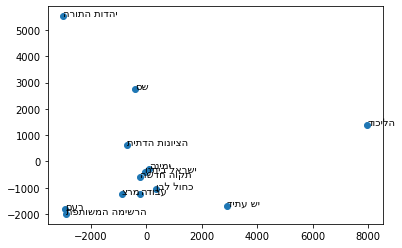

In [52]:
pca = PCA(n_components = 2)
low_dim = pca.fit_transform(df_2021_ballots.T)


plt.scatter(low_dim[:,0],low_dim[:,1])
for i, txt in enumerate(df_2021_ballots.columns):
    plt.annotate(parties_dict_2021[txt][::-1], (low_dim[i,0], low_dim[i,1]))

# b

In [53]:
def normalize(x):
  return x/np.linalg.norm(x)

normalized_df = df_2021_ballots.apply(normalize, axis = 0)

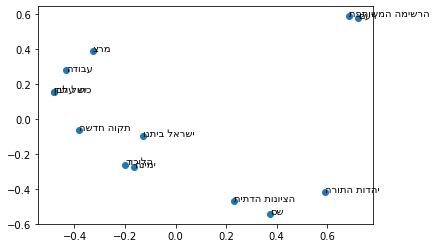

In [54]:
low_dim2 = pca.fit_transform(normalized_df.T)


plt.scatter(low_dim2[:,0],low_dim2[:,1])
for i, txt in enumerate(df_2021_ballots.columns):
    plt.annotate(parties_dict_2021[txt][::-1], (low_dim2[i,0], low_dim2[i,1]))

# 4

# a

(12127, 2)


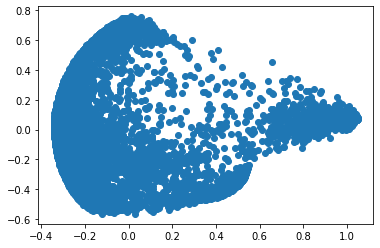

In [55]:
normalized_df_ball = df_2021_ballots.apply(normalize, axis = 1)

pca = PCA(n_components = 2)
low_dim4 = pca.fit_transform(normalized_df_ball)

print(low_dim4.shape)

plt.scatter(low_dim4[:,0],low_dim4[:,1])

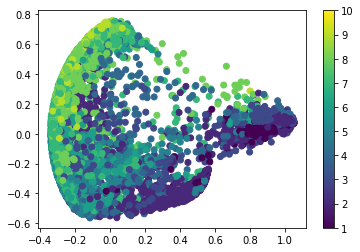

(12034,)

In [59]:
df_2021_eshkol = pd.read_csv(io.BytesIO(uploaded['eshkol_hevrati_calcali.csv']),  encoding = 'iso-8859-8')
merge_ball = df_2021_ballots_raw.merge(df_2021_eshkol, how = 'inner',right_on = "set_code", left_on = "סמל ישוב")
selected_col = list(parties_dict_2021.keys())+["eco_level"]
merge_to_opp = merge_ball[selected_col]
merge_to_opp.set_index("eco_level",inplace= True)

normalized_df_scat = merge_to_opp.apply(normalize, axis = 1)

# pca_merge = PCA(n_components = 2)

# pca.fit(normalized_df_scat.T)
# low_dim5 = pca.components_
pca = PCA(n_components = 2)
low_dim5 = pca.fit_transform(normalized_df_scat)


plt.scatter(low_dim5[:,0],low_dim5[:,1], c=merge_to_opp.index)
plt.colorbar()
plt.show()
low_dim5[:,0].shape

# b

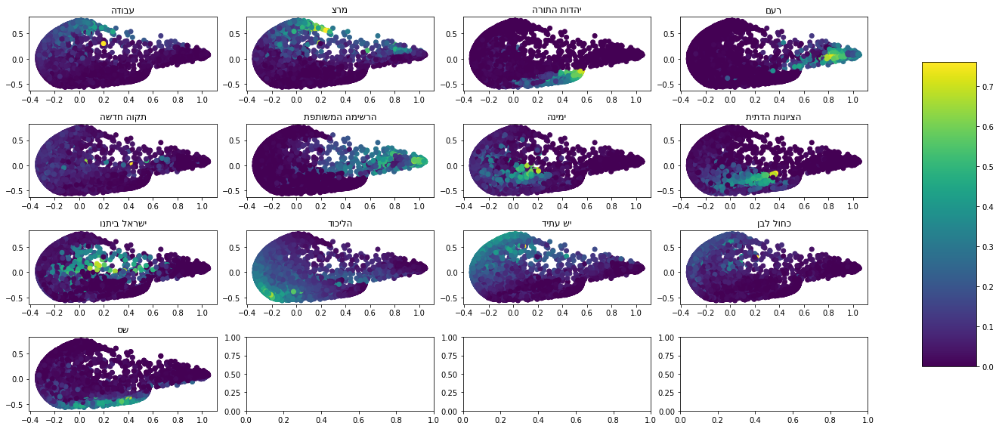

In [60]:
def plot_13():
    # for_agg = final_df.loc[:,list(parties_dict_2021.keys())+['eco_level']]
    # nice_data = for_agg.groupby('eco_level').agg("sum")
    # p_mat = nice_data.div(nice_data.sum())

    fig , axes = plt.subplots(figsize = (20,8),nrows = 4,ncols = 4)
    party_con =0
    for n in range(4):
        for m in range(4):
            new_set_idx = merge_to_opp[merge_to_opp.columns[party_con]]/merge_to_opp.sum(axis = 1)
            merge_to_opp.set_index(new_set_idx,inplace= True)
            axes[n,m].scatter(low_dim5[:,0],low_dim5[:,1], c=merge_to_opp.index)
            # axes[n,m].bar(np.arange(10), list(p_mat[p_mat.columns[party_con]]),0.3,color = "b")
            # axes[n,m].set_xticks(range(0,10))
            axes[n,m].set_title(parties_dict_2021[merge_to_opp.columns[party_con]][::-1])
            # axes[n,m].set_xticklabels(np.arange(1,11))
            #axes[n,m].colorbar()
            party_con +=1
            if party_con == 13:
                fig.tight_layout()
                fig.subplots_adjust(right=0.8)
                cbar_ax = fig.add_axes([0.85, 0.15, 0.05, 0.7])
                fig.colorbar(axes[n,m].scatter(low_dim5[:,0],low_dim5[:,1],c=merge_to_opp.index),cax=cbar_ax )        
                plt.show
                break
plot_13()